# Model evaluation against the test set:
#### This notebook evaluates birdnet against the withheld test set of 800 samples containg OSFL songs and 800 samples which do not contain the OSFL song. 

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [1]:
# imports
from pathlib import Path
import sys
BASE_PATH = Path.cwd().parent.parent
sys.path.append(str(BASE_PATH))
# model_save_path = BASE_PATH / 'models'
import pandas as pd
import opensoundscape as opso
from opensoundscape import audio
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from ipywidgets import interact
import glob

from src.utils import  show_samples_in_df, get_binary_targets_scores, suppress_warnings_if_main_branch, plot_metrics_across_thresholds, hawkears_files_to_df, plot_confusion_matrix, save_dataframe_clips_to_disk, show_sample_from_df, show_clip_from_multi_index_df, inspect_wrong_predictions

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: 'dlopen(/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/torchvision/image.so, 0x0006): Symbol not found: __ZN3c1017RegisterOperatorsD1Ev
  Referenced from: <3513EF6B-888E-345A-AB35-14CD82B000A2> /Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/torchvision/image.so
  Expected in:     <E3D17B4A-4867-3D49-BC92-E04C28EE0F45> /Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/torch/lib/libtorch_cpu.dylib'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


# Load the data

In [2]:
# load the test data
data_path = Path.cwd().parent.parent / "data"
test_df = pd.read_pickle(data_path / "processed" / "test_set" / "test_set.pkl")

The test_set.pkl file is a pandas dataframe containing the source information for 1600 x 3 second audio clips. The important columns are the file ID, which map directly to the filenames in the exported test set, and the target_present column.

In [3]:
test_df.columns

Index(['recording_url', 'task_method', 'project', 'detection_time',
       'tag_duration', 'latitude', 'longitude', 'file_type', 'media_url',
       'individual_order', 'location_id', 'filename', 'target_present',
       'target_absent', 'predicted', 'loss', 'confidence_cat', 'source',
       'organization', 'project_id', 'location', 'location_buffer_m',
       'equipment_make', 'equipment_model', 'recording_id',
       'recording_date_time', 'task_id', 'aru_task_status', 'task_duration',
       'species_code', 'species_common_name', 'species_scientific_name',
       'tag_id', 'individual_count', 'vocalization', 'rms_peak_dbfs',
       'tag_is_verified', 'tag_rating', 'observer', 'observer_id',
       'species_individual_comments', 'task_comments', 'wildtrax_url',
       'target', 'path', 'prediction', 'file_ID'],
      dtype='object')

In [4]:
test_df.target_present.value_counts(dropna=False)

target_present
1.0    800
0.0    800
Name: count, dtype: int64

In [5]:
test_df[['target_present', 'file_ID']].head()

target_present  \
file                                               start_time end_time                   
../../data/raw/recordings/OSFL/recording-50028.... 12.0       15.0                 1.0   
                                                   63.0       66.0                 1.0   
../../data/raw/recordings/OSFL/recording-70937.mp3 13.5       16.5                 1.0   
../../data/raw/recordings/OSFL/recording-97916.mp3 67.5       70.5                 1.0   
                                                   69.0       72.0                 1.0   

                                                                        file_ID  
file                                               start_time end_time           
../../data/raw/recordings/OSFL/recording-50028.... 12.0       15.0            0  
                                                   63.0       66.0            1  
../../data/raw/recordings/OSFL/recording-70937.mp3 13.5       16.5            2  
../../data/raw/recordings/OSFL/recording-97916.mp3 67.5       70.5            3  
                                                   69.0       72.0            4

# Load the birdnet model
First I cloned the github repo, and added a species list containing the olive sided flycatcher.


# Make predictions with the model
The threshold was set to the lowest available in order to be able to get a reading for OSFL score for each clip and to compare with other models evaluated against this test set. 

terminal command used for analysis:
```bash
python3 -m birdnet_analyzer.analyze ../osfl_cnn_recognizer/data/processed/test_set/clips/ --slist species_list.txt --min_conf 0.00001 --rtype '.csv'
```

# Process the output data

In [6]:
folder = BASE_PATH/ "data" / "processed" / "test_set" / "birdnet-results"

Some of the csv files are missed during concatenation - this is because the prediction score is below the minimum of 0.00001 so no data is generated in the csv file. These 16 files have Confidence set to 0.0. Indexing the dataframe by file number allows subsequent concatenation with the labels. 

In [7]:
dfs = []
for f in folder.glob("*.csv"):
    df = pd.read_csv(f)
    if df.empty:
        # 16 of the csv files have no rows due to score lower than 0.00001
        # These are given confidence of 0.0
        df = pd.DataFrame({
            'Confidence': [0.0],
            'filename': [f.name]
        })
    else:
        df['filename'] = f.name
    dfs.append(df)

birdnet_df = pd.concat(dfs, ignore_index=True)
birdnet_df["file_number"] = birdnet_df["filename"].str.extract(r"(\d+)").astype(int)
# birdnet_df.drop(columns=["Start (s)", "End (s)"], inplace=True)
birdnet_df.set_index("file_number", inplace=True)
birdnet_df.sort_index(inplace=True)
birdnet_df.sample(5)

,Start (s),End (s),Scientific name,Common name,Confidence,File,filename
file_number,,,,,,,
1018,0.0,3.0,Contopus cooperi,Olive-sided Flycatcher,0.0682,../osfl_cnn_recognizer/data/processed/test_set...,1018.BirdNET.results.csv
308,0.0,3.0,Contopus cooperi,Olive-sided Flycatcher,0.6598,../osfl_cnn_recognizer/data/processed/test_set...,308.BirdNET.results.csv
17,0.0,3.0,Contopus cooperi,Olive-sided Flycatcher,0.9404,../osfl_cnn_recognizer/data/processed/test_set...,17.BirdNET.results.csv
664,0.0,3.0,Contopus cooperi,Olive-sided Flycatcher,0.0022,../osfl_cnn_recognizer/data/processed/test_set...,664.BirdNET.results.csv
1209,0.0,3.0,Contopus cooperi,Olive-sided Flycatcher,0.9827,../osfl_cnn_recognizer/data/processed/test_set...,1209.BirdNET.results.csv


In [8]:
ids_and_labels = test_df.set_index("file_ID")
ids_and_labels = ids_and_labels[["target_present"]]
ids_and_labels.sample(5)

,target_present
file_ID,
67,1.0
1102,1.0
225,1.0
43,1.0
1507,0.0


In [9]:
birdnet_df = pd.concat([birdnet_df, ids_and_labels], axis=1)
birdnet_df.sample(5)

,Start (s),End (s),Scientific name,Common name,Confidence,File,filename,target_present
147,0.0,3.0,Contopus cooperi,Olive-sided Flycatcher,0.0263,../osfl_cnn_recognizer/data/processed/test_set...,147.BirdNET.results.csv,1.0
414,0.0,3.0,Contopus cooperi,Olive-sided Flycatcher,0.0002,../osfl_cnn_recognizer/data/processed/test_set...,414.BirdNET.results.csv,1.0
914,0.0,3.0,Contopus cooperi,Olive-sided Flycatcher,0.0001,../osfl_cnn_recognizer/data/processed/test_set...,914.BirdNET.results.csv,0.0
488,0.0,3.0,Contopus cooperi,Olive-sided Flycatcher,0.0073,../osfl_cnn_recognizer/data/processed/test_set...,488.BirdNET.results.csv,1.0
989,0.0,3.0,Contopus cooperi,Olive-sided Flycatcher,0.0003,../osfl_cnn_recognizer/data/processed/test_set...,989.BirdNET.results.csv,0.0


# Plot metrics across thresholds

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


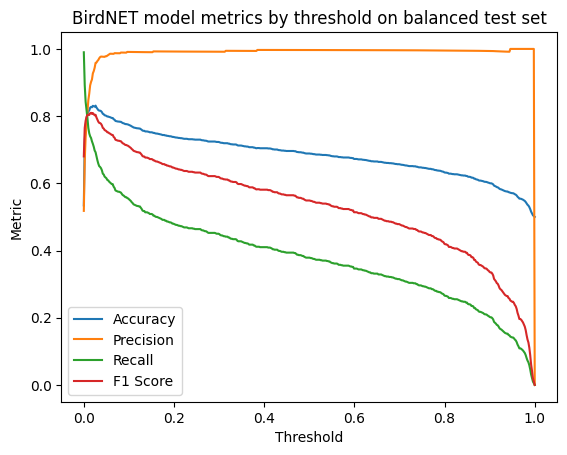

In [10]:
title = "BirdNET model metrics by threshold on balanced test set"
data, names = plot_metrics_across_thresholds(birdnet_df, 'Confidence', 'target_present', title = title)

![osfl balanced test set PR curves for comparison](/Users/mikeg/code/machine_learning/osfl_cnn_recognizer/reports/osfl-test-metrics.png)

In [11]:
# Find which threshold has highest F1 score
names.insert(0, 'threshold')
df = pd.DataFrame(data,columns=[names])
df.loc[df["F1 Score"].idxmax()]

,threshold,Accuracy,Precision,Recall,F1 Score
8,tensor(0.0160),0.8275,0.90184,0.735,0.809917


In [12]:
thresh = df.loc[df["F1 Score"].idxmax()].threshold.values[0][0].item()

In [13]:
preds = pd.DataFrame(birdnet_df["Confidence"])
preds["target_present"] = preds["Confidence"]
labels = pd.DataFrame(birdnet_df["target_present"])


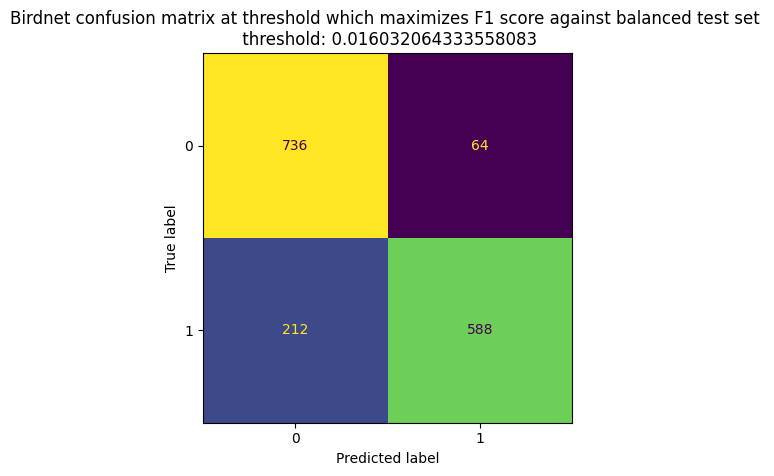

In [14]:
title="Birdnet confusion matrix at threshold which maximizes F1 score against balanced test set"
cm = plot_confusion_matrix(labels,preds,threshold=thresh, title=title)

# Collect the false negatives and false postitves

In [15]:
print(f"Threshold at best F1 score: {thresh}")
if Path.exists(data_path / "interim" / "test_set" / "false_positive_comments.pkl"):
    false_positives = pd.read_pickle(data_path / "interim" / "test_set" / "false_positive_comments.pkl")
else:
    false_positives = birdnet_df.loc[birdnet_df['Confidence'] > thresh].loc[birdnet_df['target_present'] == 0.0]
if Path.exists(data_path / "interim" / "test_set" / "false_negative_comments.pkl"):
    false_negatives = pd.read_pickle(data_path / "interim" / "test_set" / "false_negative_comments.pkl")
else:
    false_negatives = birdnet_df.loc[birdnet_df['Confidence'] < thresh].loc[birdnet_df['target_present'] == 1.0]
len(false_positives), len(false_negatives)

Threshold at best F1 score: 0.016032064333558083


(64, 212)

In [16]:
false_negatives["File"] = "../../" + false_negatives["File"]
false_negatives.set_index(["File", "Start (s)", "End (s)"], inplace=True)
false_negatives = false_negatives.sample(20)

# Inspect a sample of 20 false negatives
- these are OSFL songs that were not detected by the model.

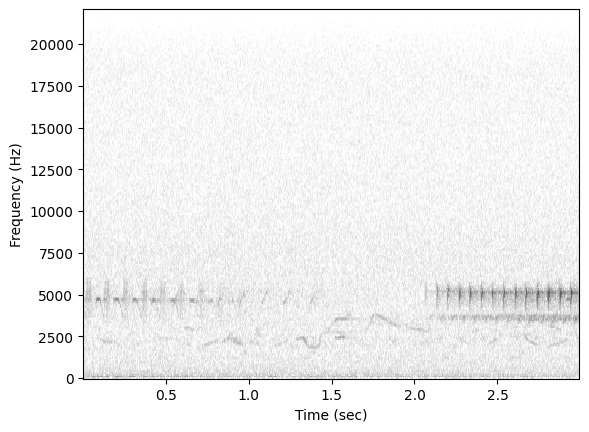

Comment saved: other species are present but OSFL call is clear


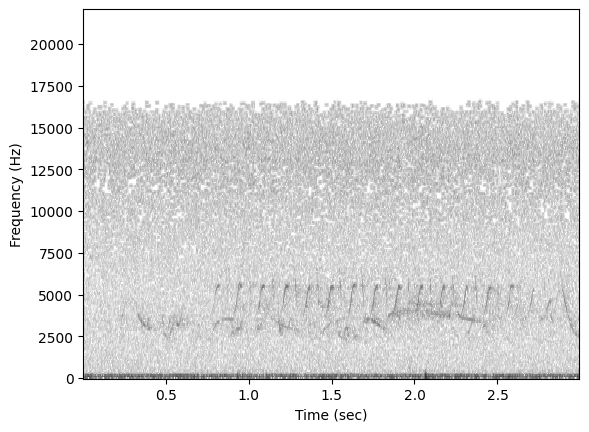

Comment saved: osfl song is masked by other species in a noisy low quality recording


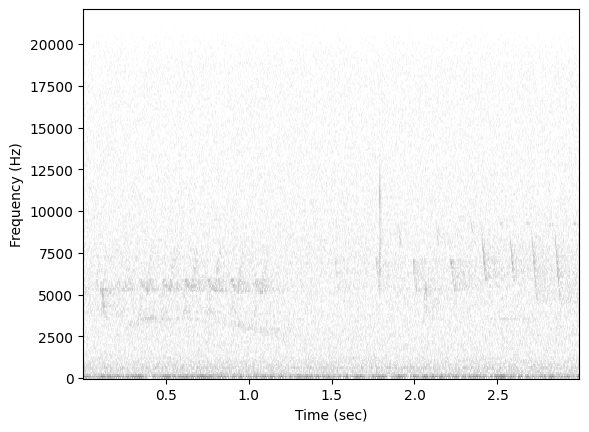

Comment saved: osfl song is quiet and other species are present


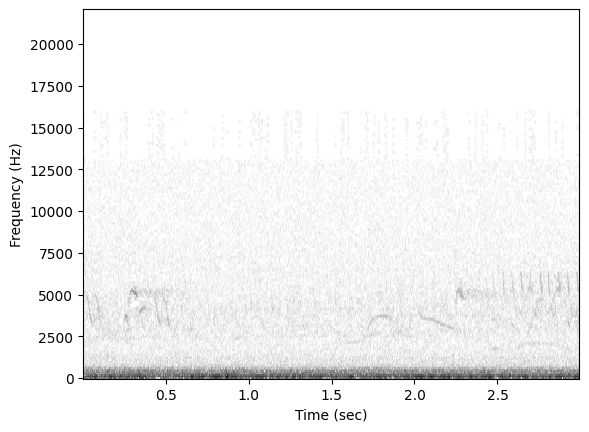

Comment saved: a bassy rumble is present in the recording, osfl song is clear


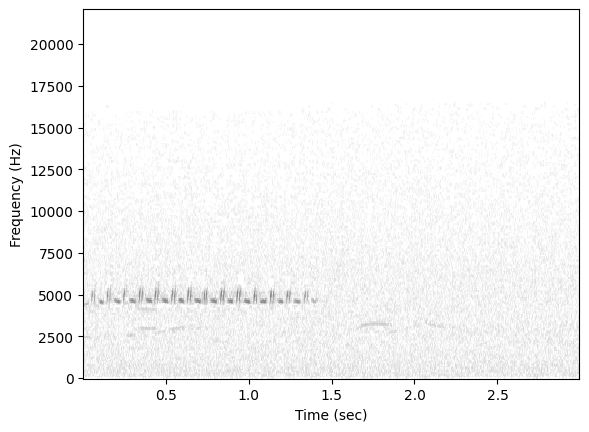

Comment saved: other species is present but not masking the osfl song


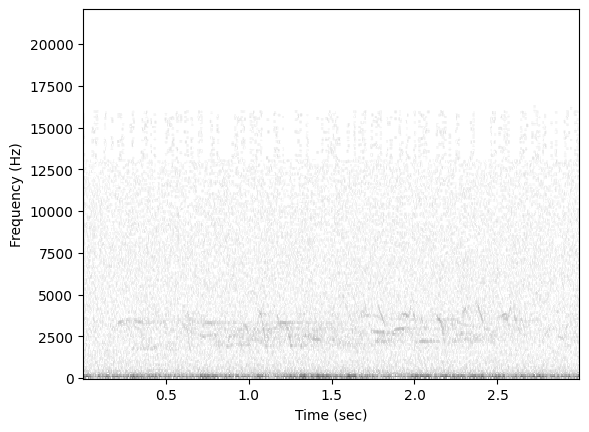

Comment saved: osfl song is heavily masked and quiet at 0.25-0.8 seconds


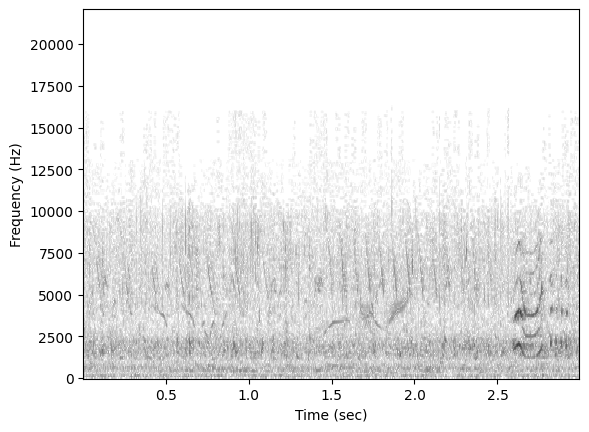

Comment saved: water environmental noise present and other species in recording


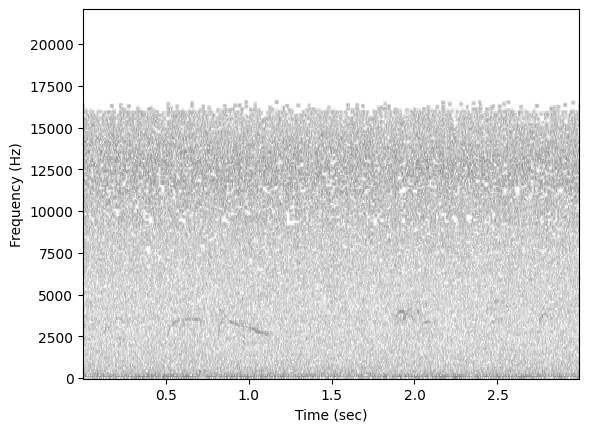

Comment saved: recording hiss in low quality file, song is clear


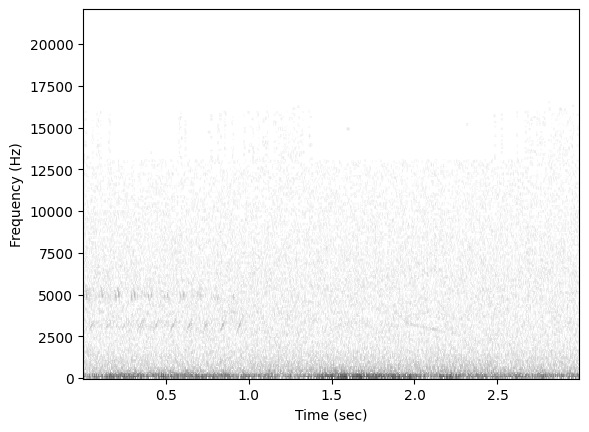

Comment saved: wind noise, quiet song


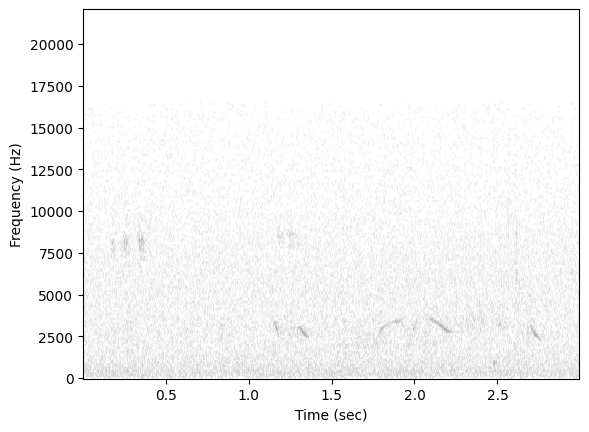

Comment saved: quiet song


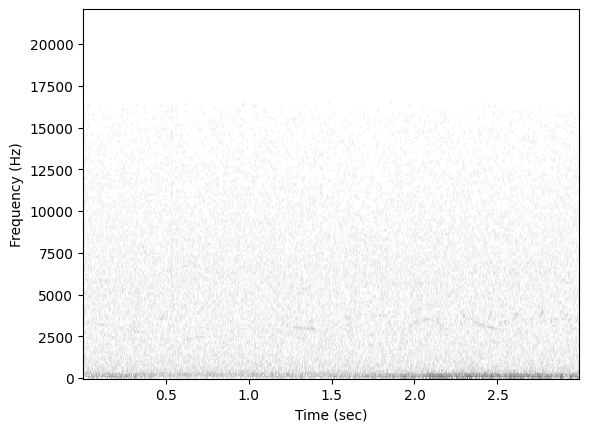

Comment saved: quiet song


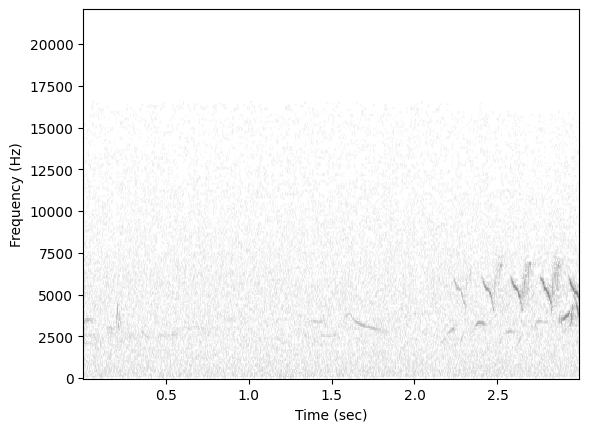

Comment saved: quiet song, other species in recording


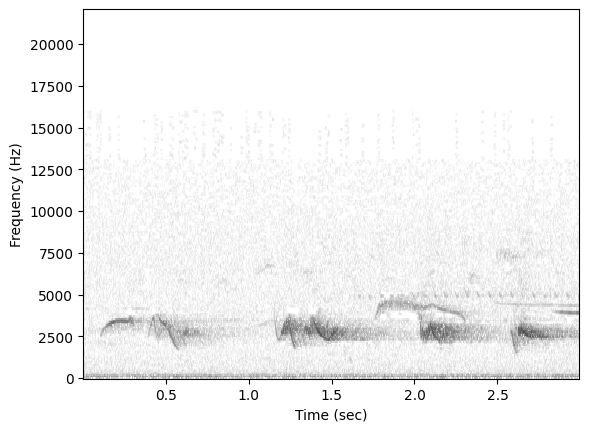

Comment saved: three species prominent in recording, one is a partially masked osfl song


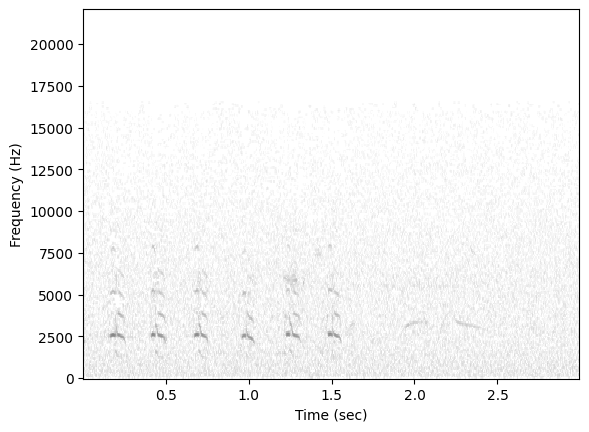

Comment saved: quiet osfl song and other species is present


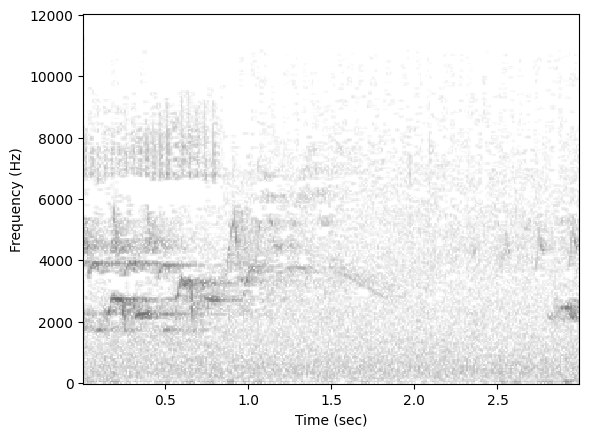

Comment saved: low quality recording with osfl song after swainson's thrush


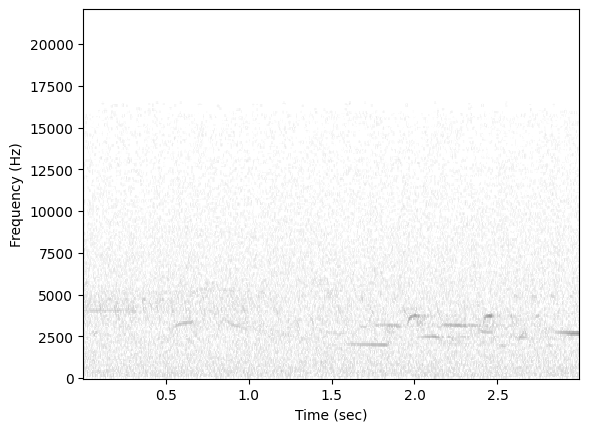

Comment saved: quiet osfl song followed by other species


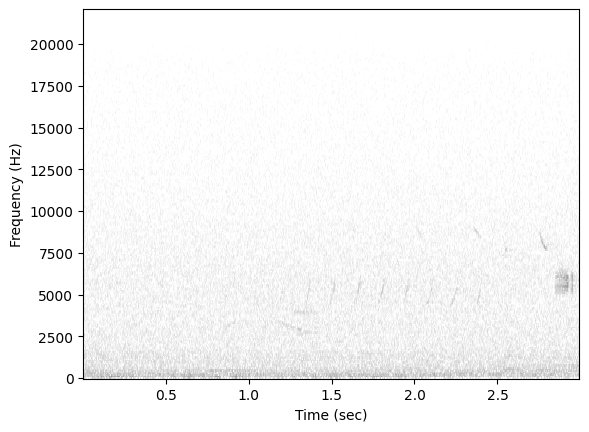

Comment saved: quiet osfl song followed by other species


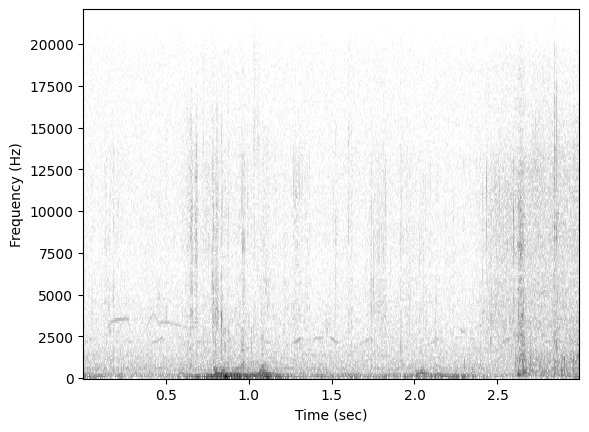

Comment saved: osfl song and some mechanical movement of recorder


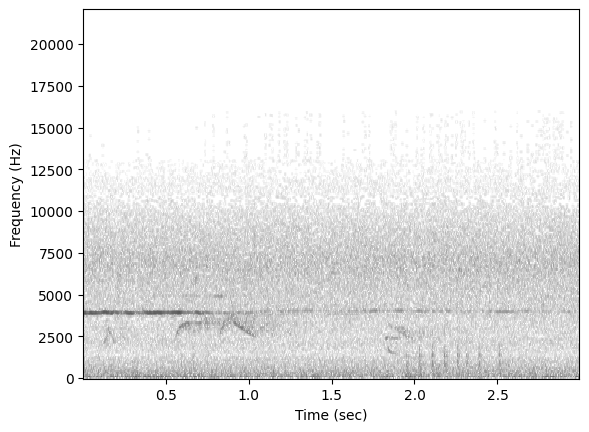

Comment saved: osfl song clear but with partial masking


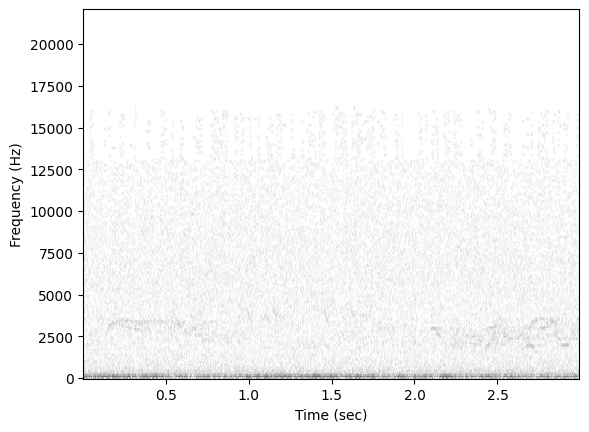

Comment saved: quiet osfl song


In [17]:
inspect_wrong_predictions(false_negatives, "false_negative_comments")

In [18]:
false_positives["File"] = "../../" + false_positives["File"]
false_positives.set_index(["File", "Start (s)", "End (s)"], inplace=True)
false_positives = false_positives.sample(20)

# Inspect a sample of 20 false positives
- these are non OSFL songs that were detected by the model.
- Some of these may contain OSFL songs, which highlights the difficutly in curating a perfect test set. These would only affect the precision curve and not the recall. 

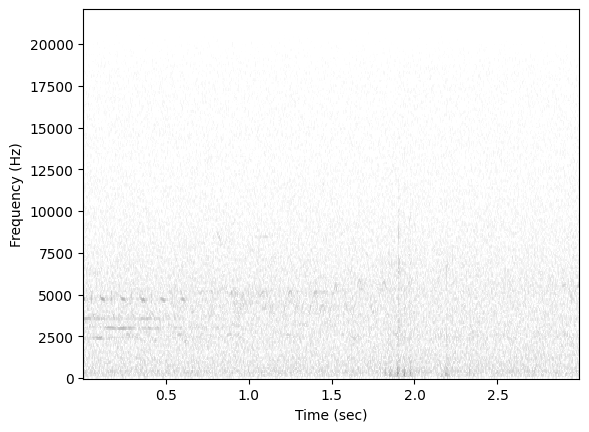

Comment saved: absent


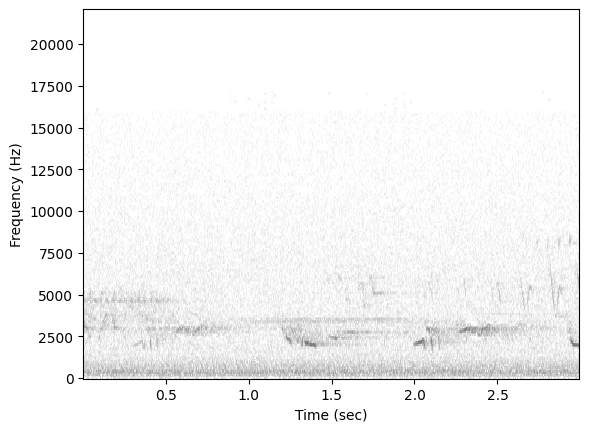

Comment saved: absent


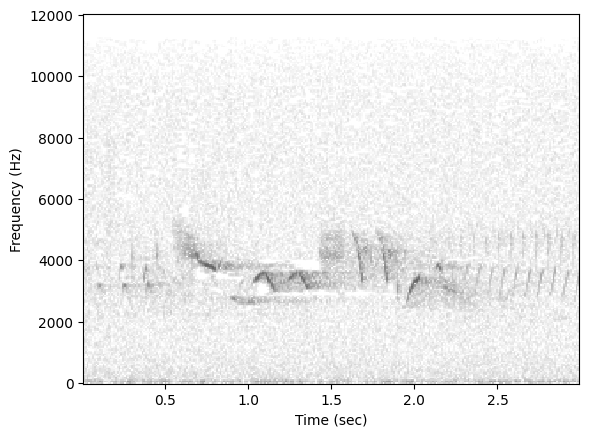

Comment saved: possibly present mislabel


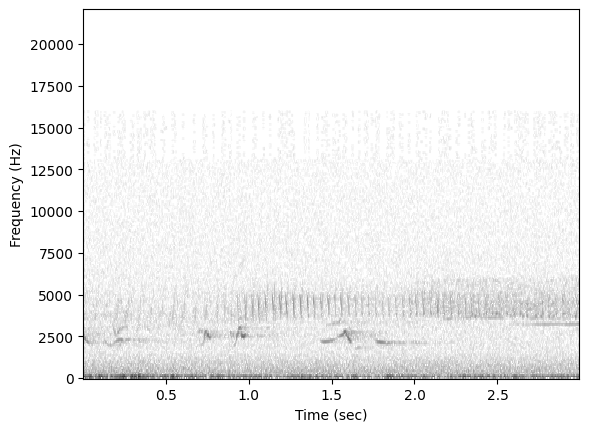

Comment saved: other species


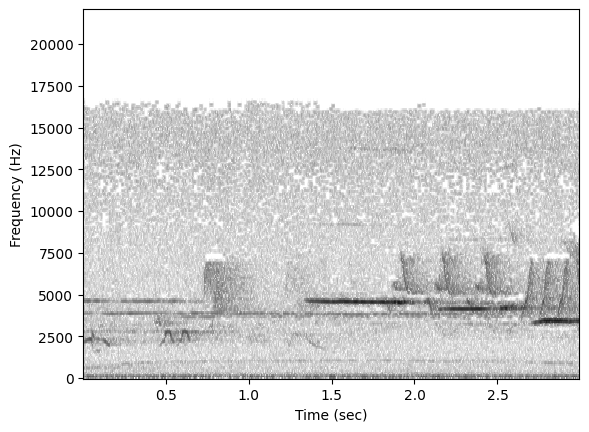

Comment saved: noisy scene with sirens and other species present, unclear whether this is osfl at 1.4 s


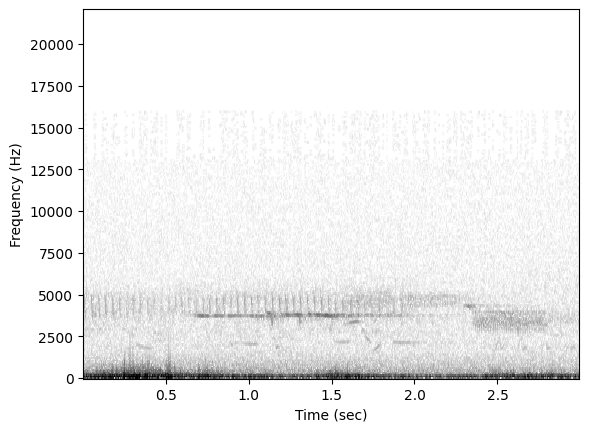

Comment saved: absent, wind noise, other species present


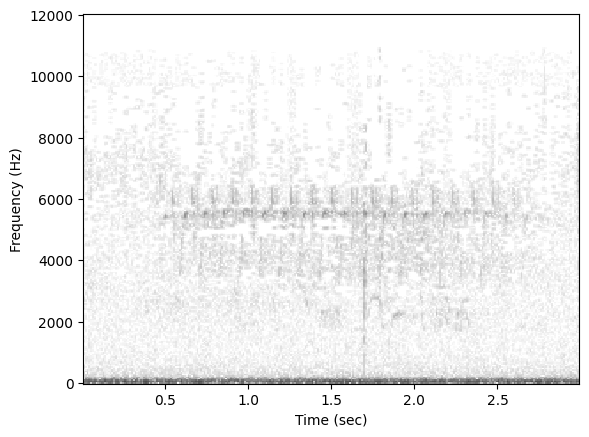

Comment saved: absent, low quality recording with other species present and wind noise


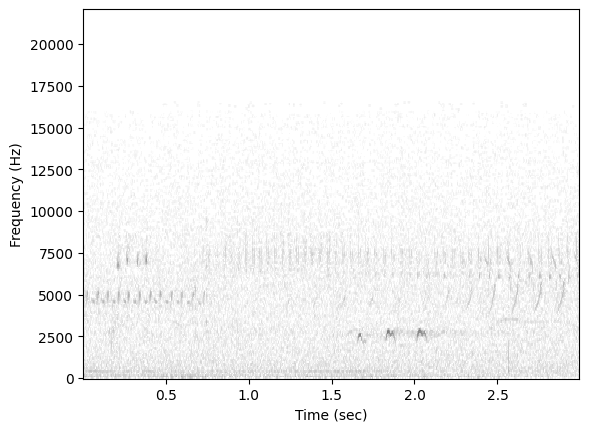

Comment saved: osfl call and quiet song at end of recording - mislabelled present


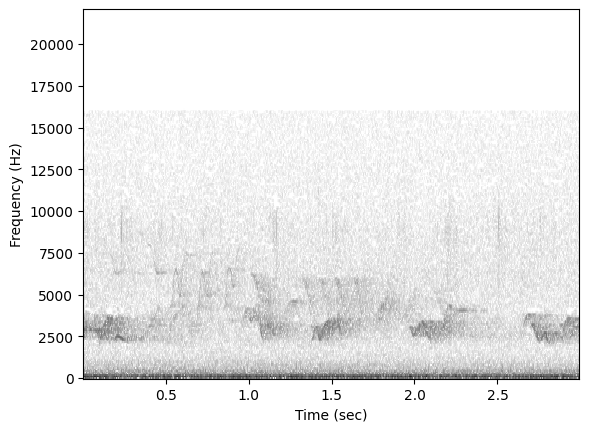

Comment saved: other species, bass noise


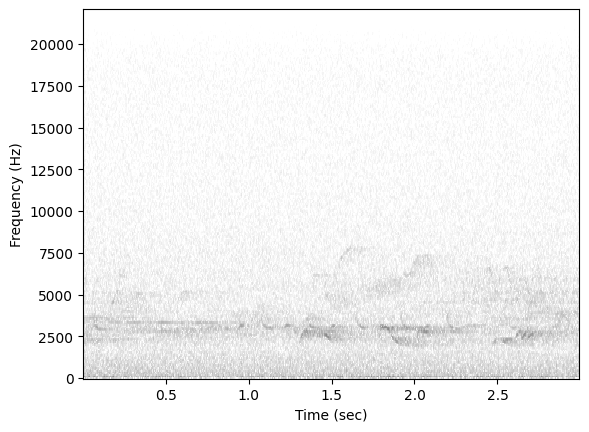

Comment saved: other species


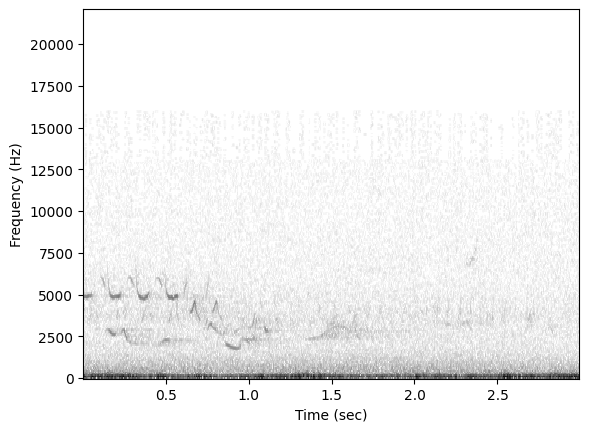

Comment saved: other species


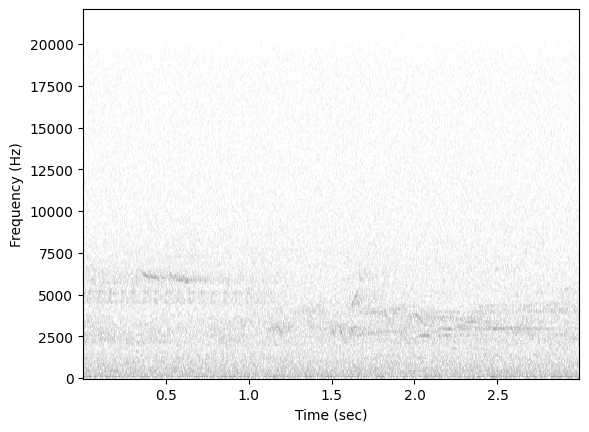

Comment saved: other species


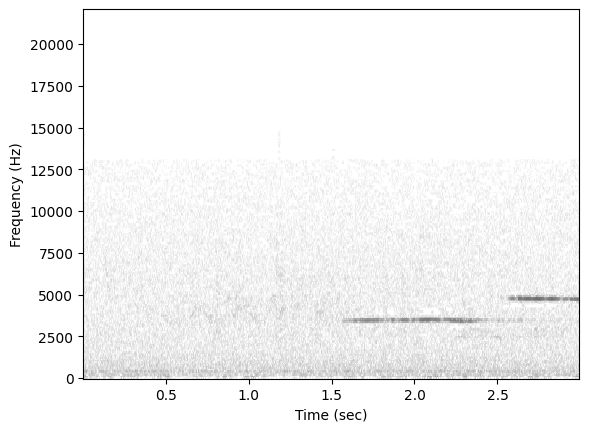

Comment saved: other species


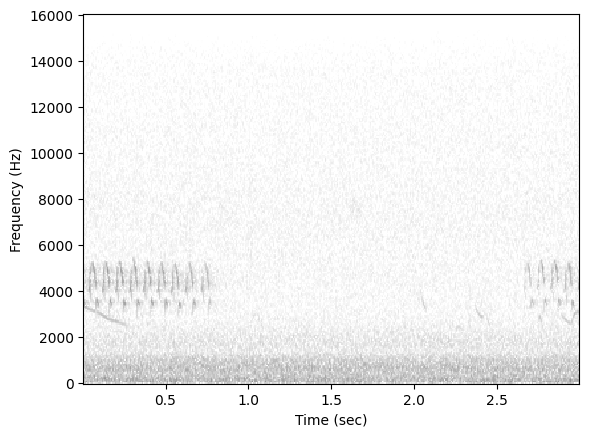

Comment saved: possible tail end of osfl song at start of recording


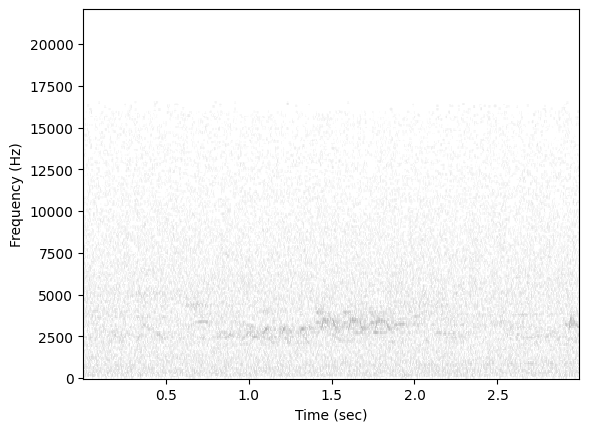

Comment saved: possible very faint osfl song at start but hard to tell


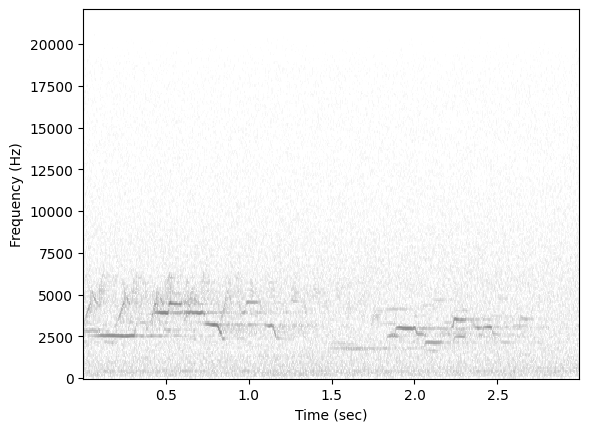

Comment saved: other species


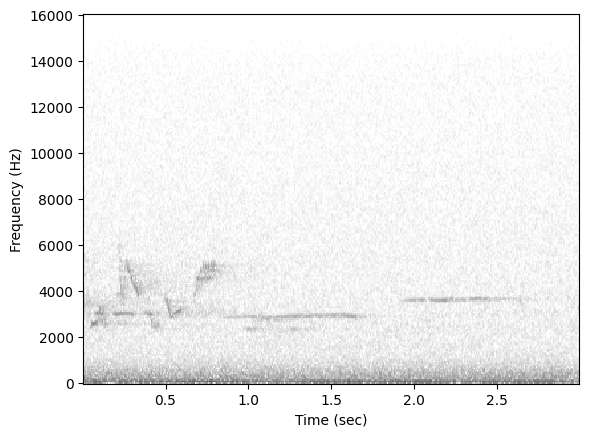

Comment saved: other species


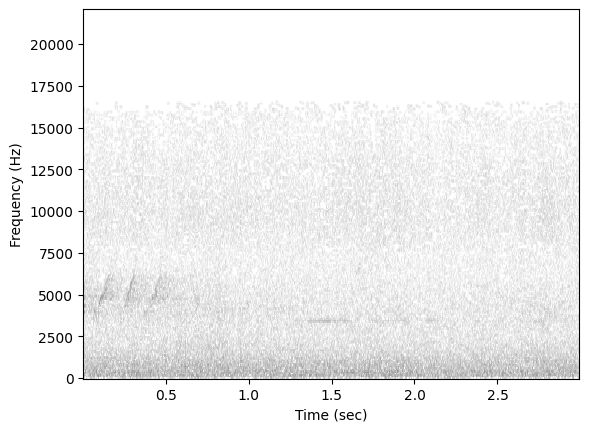

Comment saved: other species


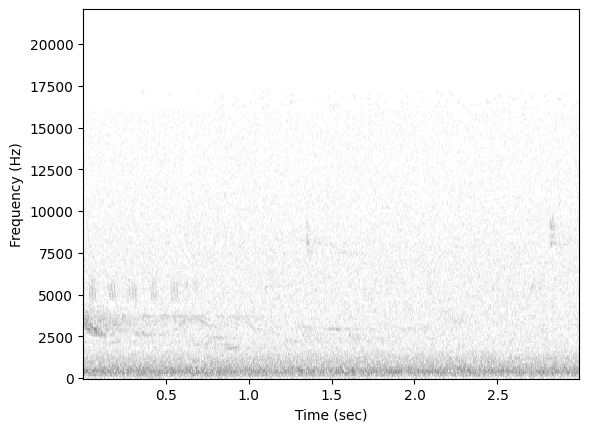

Comment saved: possible faint osfl song at 0.5-1s


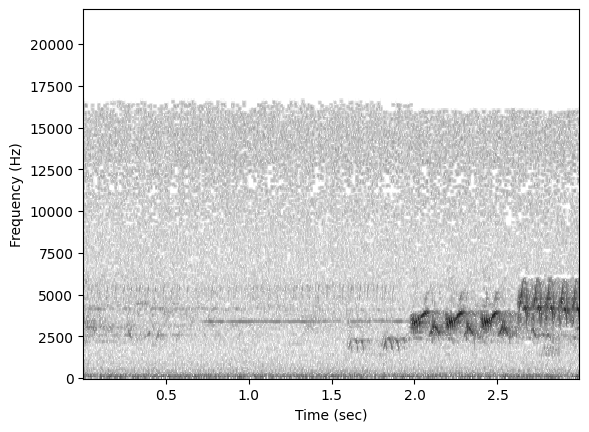

Comment saved: absent, otehr species present and very loud


In [19]:
inspect_wrong_predictions(false_positives, comments_col_name="false_positive_comments")

In [21]:
false_positives.to_pickle(data_path / "processed" / "test_set" / "bn_false_positive_comments.pkl")
false_negatives.to_pickle(data_path / "processed" / "test_set" / "bn_false_negative_comments.pkl")

## False positive comments

In [22]:
false_positives.false_positive_comments.value_counts()

false_positive_comments
other species                                                                               8
absent                                                                                      2
possibly present mislabel                                                                   1
noisy scene with sirens and other species present, unclear whether this is osfl at 1.4 s    1
absent, wind noise, other species present                                                   1
absent, low quality recording with other species present and wind noise                     1
osfl call and quiet song at end of recording - mislabelled present                          1
other species, bass noise                                                                   1
possible tail end of osfl song at start of recording                                        1
possible very faint osfl song at start but hard to tell                                     1
possible faint osfl song at 0.5-1s  

## False negative comments

In [23]:
false_negatives.false_negative_comments.value_counts()  

false_negative_comments
quiet song                                                                   2
quiet osfl song followed by other species                                    2
osfl song is masked by other species in a noisy low quality recording        1
osfl song clear but with partial masking                                     1
osfl song and some mechanical movement of recorder                           1
low quality recording with osfl song after swainson's thrush                 1
quiet osfl song and other species is present                                 1
three species prominent in recording, one is a partially masked osfl song    1
quiet song, other species in recording                                       1
other species are present but OSFL call is clear                             1
wind noise, quiet song                                                       1
recording hiss in low quality file, song is clear                            1
water environmental noise pr

# Analysis
It looks as though the SOTA multi species models have high precision across all thresholds, and low recall when measured against this test set. 
- The test set I used was curated to contain a mixture of clear and masked examples from a variety of audio sources and environmental noise, and masking, which the model is expected to encounter in the wild and on a backlog of past audio recordings from past years. 
- Choosing a threshold of 0.5 for either hawkears or birdnet would give precision close to 1, but the model would miss many of those bird songs that are masked by other species, or are quiet, or which are in noisy environments.
- The intended use case for any model is an important consideration. This test set was designed to contain difficult examples to show how a model will perform on the kind of audio from field recordings. 